<a href="https://colab.research.google.com/github/Syed8855/Titanic_Dataset_Profile_Repo/blob/main/Analysing_Survival_on_the_Titanic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing Libraries

1.  **Pandas** For Data Manipulation & Analysis
2.   **Numpy** for Numerical Computing


1.   **Matplotlib** for Data Visualization
2.   **Seaborn(sns)** for Statistical data visualization





In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
!git clone 'https://github.com/GeeksforgeeksDS/21-Days-21-Projects-Dataset'

fatal: destination path '21-Days-21-Projects-Dataset' already exists and is not an empty directory.


In [ ]:
titanic_dt = pd.read_csv("/content/21-Days-21-Projects-Dataset/Datasets/Titanic-Dataset.csv")

**First 5 Rows of the dataset**

In [ ]:
titanic_dt.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


**Last Five Rows of the dataset**




In [ ]:
titanic_dt.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.00,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.00,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,C148,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,NaN,Q


# Concise Summary of the DataFrame

In [ ]:
titanic_dt.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


# Descriptive Statistics For Numerical Columns

In [ ]:
titanic_dt.describe()

,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,714.000000,891.000000,891.000000,891.000000
mean,446.000000,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,257.353842,0.486592,0.836071,14.526497,1.102743,0.806057,49.693429
min,1.000000,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,223.500000,0.000000,2.000000,20.125000,0.000000,0.000000,7.910400
50%,446.000000,0.000000,3.000000,28.000000,0.000000,0.000000,14.454200
75%,668.500000,1.000000,3.000000,38.000000,1.000000,0.000000,31.000000
max,891.000000,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


In [ ]:
titanic_dt['Cabin'].value_counts()

,count
Cabin,
G6,4
C23 C25 C27,4
B96 B98,4
F2,3
D,3
...,...
E17,1
A24,1
C50,1


# Data Cleaning

In [ ]:
print("Missing values before cleaning")
titanic_dt.isna().sum()

Missing values before cleaning


,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
Age,177
SibSp,0
Parch,0
Ticket,0
Fare,0


Handling missing 'Age' Values using median to fill missing ages


In [ ]:
median_age = titanic_dt['Age'].median()
titanic_dt['Age']= titanic_dt['Age'].fillna(median_age)

In [ ]:
print("Missing Values after Age Cleaning")
print(titanic_dt[['Age','Embarked','Cabin']].isna().sum())

Missing Values after Age Cleaning
Age           0
Embarked      2
Cabin       687
dtype: int64


In [ ]:
mode = titanic_dt['Embarked'].mode()[0]
print(mode)

S


In [ ]:
mode_embarked = titanic_dt['Embarked'].mode()[0]
titanic_dt['Embarked'] = titanic_dt['Embarked'].fillna(mode_embarked)

print("Missing Values after Embarked Cleaning")
titanic_dt[['Age','Embarked','Cabin']].isna().sum()

Missing Values after Embarked Cleaning


,0
Age,0
Embarked,0
Cabin,687


.notna() checks each value in the "Cabin" Column to see if it is not a missing value

In [ ]:
titanic_dt['Has_Cabin'] = titanic_dt['Cabin'].notna().astype(int)
if 'Cabin' in titanic_dt.columns:
    titanic_dt.drop('Cabin',axis =1,inplace = True)

In [ ]:
titanic_dt['Has_Cabin'].value_counts()

,count
Has_Cabin,
0,687
1,204


In [ ]:
titanic_dt.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Has_Cabin
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,1
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,1
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,0


In [ ]:
print('Missing values after cleaning')
titanic_dt.isna().sum()

Missing values after cleaning


,0
PassengerId,0
Survived,0
Pclass,0
Name,0
Sex,0
Age,0
SibSp,0
Parch,0
Ticket,0
Fare,0


# Univariate Analysis

Analyzing Categorical Features:


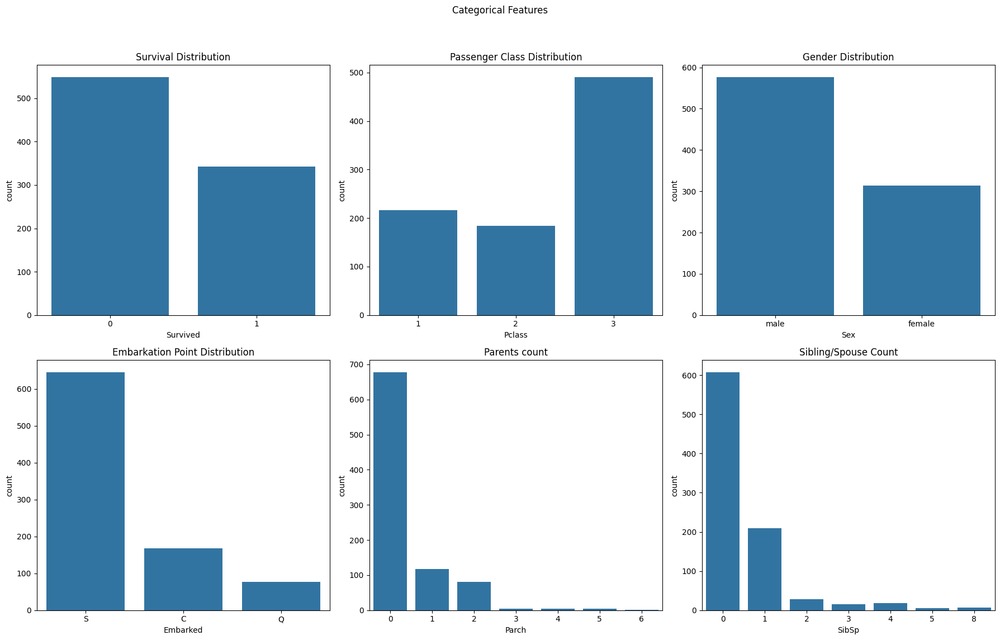

In [ ]:
print('Analyzing Categorical Features:')
fig,axes = plt.subplots(2,3,figsize = (18,12))
fig.suptitle('Categorical Features')
#plotting each categorical Feature
sns.countplot(x = 'Survived',data = titanic_dt,ax = axes[0,0]).set_title('Survival Distribution')
sns.countplot(x = 'Pclass',data = titanic_dt,ax = axes[0,1]).set_title('Passenger Class Distribution')
sns.countplot(x = 'Sex',data = titanic_dt,ax = axes[0,2]).set_title('Gender Distribution')
sns.countplot(x = 'Embarked',data = titanic_dt,ax = axes[1,0]).set_title('Embarkation Point Distribution')
sns.countplot(x = 'Parch',data = titanic_dt,ax = axes[1,1]).set_title('Parents count')
sns.countplot(x = 'SibSp',data = titanic_dt,ax = axes[1,2]).set_title('Sibling/Spouse Count')
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


 Analysing Numerical data


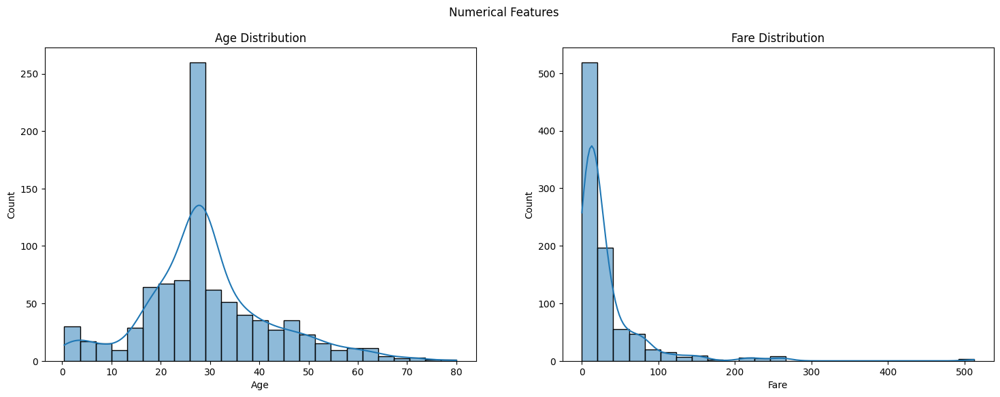

In [ ]:
print('\n Analysing Numerical data')
fig, axes = plt.subplots(1,2,figsize = (18,6))
fig.suptitle('Numerical Features')
#plotting each numerical feature
sns.histplot(titanic_dt['Age'],bins = 25,kde = True, ax = axes[0]).set_title('Age Distribution')
sns.histplot(titanic_dt['Fare'],bins = 25,kde = True, ax = axes[1]).set_title('Fare Distribution')
plt.show()

# BiVariate Analysis

Bivariate Analysis: Feature vs Survival


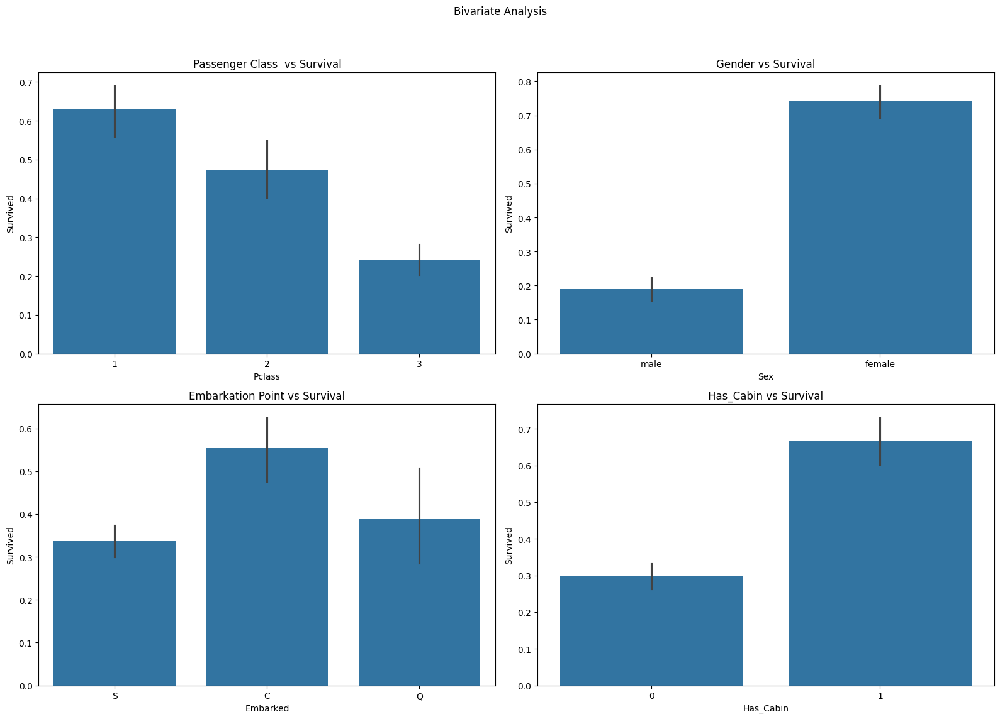

In [ ]:
print('Bivariate Analysis: Feature vs Survival')
fig,axes = plt.subplots(2,2,figsize = (16,12))
fig.suptitle('Bivariate Analysis')

#Pclass Vs Survived
sns.barplot(x = 'Pclass',y = 'Survived',data = titanic_dt,ax = axes[0,0]).set_title('Passenger Class  vs Survival')
#Sex Vs Survived
sns.barplot(x = 'Sex',y = 'Survived',data = titanic_dt,ax = axes[0,1]).set_title('Gender vs Survival')
# Embarked Vs Survived
sns.barplot(x = 'Embarked',y = 'Survived',data = titanic_dt,ax = axes[1,0]).set_title('Embarkation Point vs Survival')
# Has_cabin Vs Survived
sns.barplot(x = 'Has_Cabin',y = 'Survived',data = titanic_dt,ax = axes[1,1]).set_title('Has_Cabin vs Survival')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Bivariate Analysis (Feature vs Survival):

* Passenger Class vs Survival: Passengers in Pclass 1 had a much higher survival rate compared to those in Pclass 2 and Pclass 3. Pclass 3 had the lowest survival rate.
* Gender vs Survival: Female passengers had a significantly higher survival rate than male passengers.
* Embarkation Point vs Survival: Passengers who embarked from port 'C' had a higher survival rate than those who embarked from 'S' or 'Q'.
* Has_Cabin vs Survival: Passengers with a cabin recorded had a higher survival rate than those without a recorded cabin.




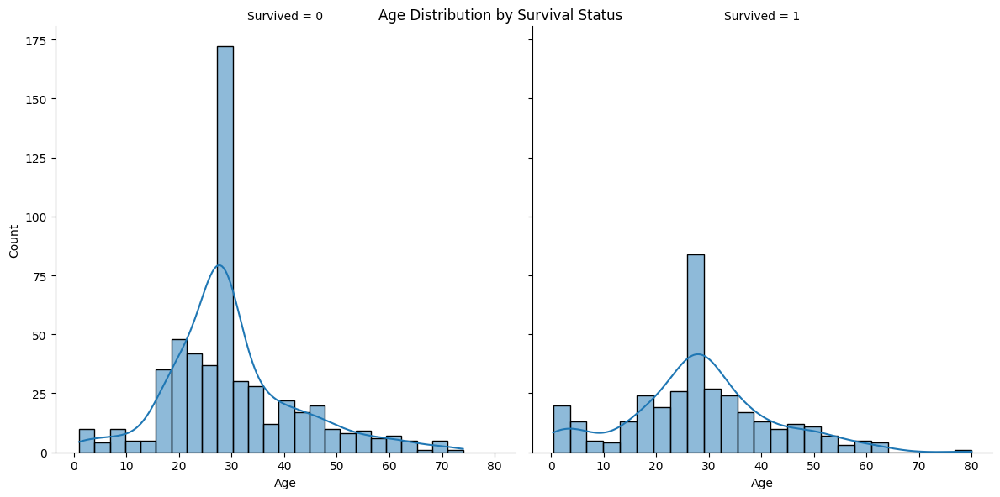

In [ ]:
g = sns.FacetGrid(titanic_dt,col='Survived',height =6)
g.map(sns.histplot,'Age',bins = 25,kde=True)
plt.suptitle('Age Distribution by Survival Status')
plt.show()


<Axes: ylabel='Fare'>

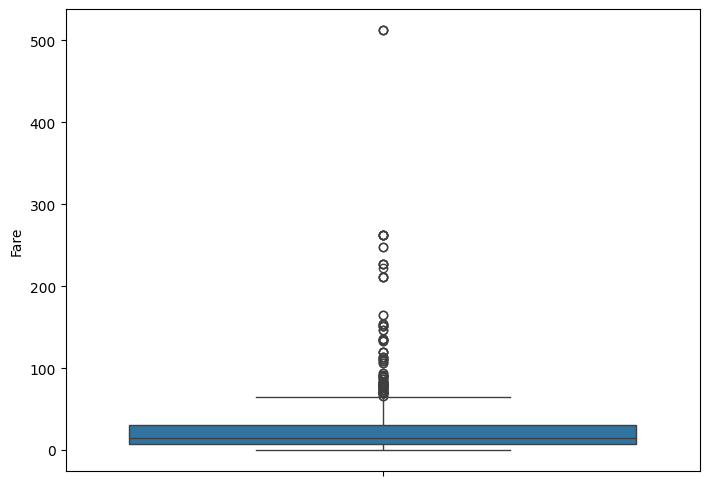

In [ ]:
plt.figure(figsize = (18,6))
plt.subplot(1,2,1)
sns.boxplot(y = 'Fare',data = titanic_dt)

 key observations:

* The median fare is relatively low, indicated by the line within the box.
* The interquartile range (IQR), represented by the box, shows that the majority of fares are concentrated at the lower end of the scale.
* There are a significant number of outliers above the upper whisker, indicating that some passengers paid very high fares. This suggests a skewed distribution with a long tail towards higher values.
* The minimum fare is 0, which might represent passengers who were staff or children traveling for free.

# Feature Engineering

In [ ]:
titanic_dt['FamilySize'] = titanic_dt['SibSp'] + titanic_dt['Parch'] + 1

titanic_dt['IsAlone'] =0
titanic_dt.loc[titanic_dt['FamilySize'] == 1,'IsAlone'] = 1

print("created 'FamilySize' and 'IsAlone' features")
display(titanic_dt[['FamilySize','IsAlone']].head())

created 'FamilySize' and 'IsAlone' features


,FamilySize,IsAlone
0,2,0
1,2,0
2,1,1
3,2,0
4,1,1


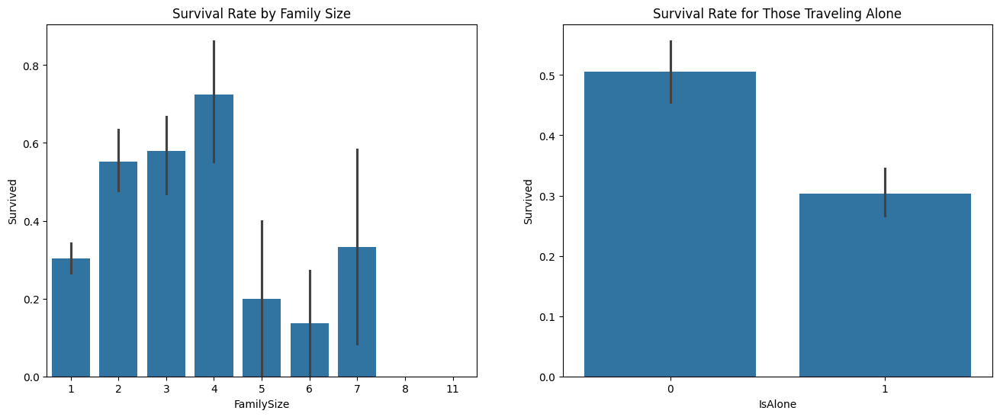

In [ ]:
# Analyze the new family-related features against survival
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Survival Rate by FamilySize
sns.barplot(ax=axes[0], x='FamilySize', y='Survived', data=titanic_dt).set_title('Survival Rate by Family Size')

# Survival Rate by IsAlone
sns.barplot(ax=axes[1], x='IsAlone', y='Survived', data=titanic_dt).set_title('Survival Rate for Those Traveling Alone')

plt.show()

In [ ]:
titanic_dt['Title'] = titanic_dt['Name'].str.extract(r' ([A-Za-z]+)\.',expand = False)

print("Extracted Titles:")
titanic_dt['Title'].value_counts()

Extracted Titles:


,count
Title,
Mr,517
Miss,182
Mrs,125
Master,40
Dr,7
Rev,6
Col,2
Mlle,2
Major,2


In [ ]:
titanic_dt['Title'] = titanic_dt['Title'].replace(['Lady','Countess','Capt','Col','Don','Dr','Major','Rev','Sir','Jonkheer','Dona'],'Rare')
titanic_dt['Title'] = titanic_dt['Title'].replace('Mlle','Miss')
titanic_dt['Title'] = titanic_dt['Title'].replace('Ms','Miss')
titanic_dt['Title'] = titanic_dt['Title'].replace('Mme','Mrs')


# Multivariate Analysis

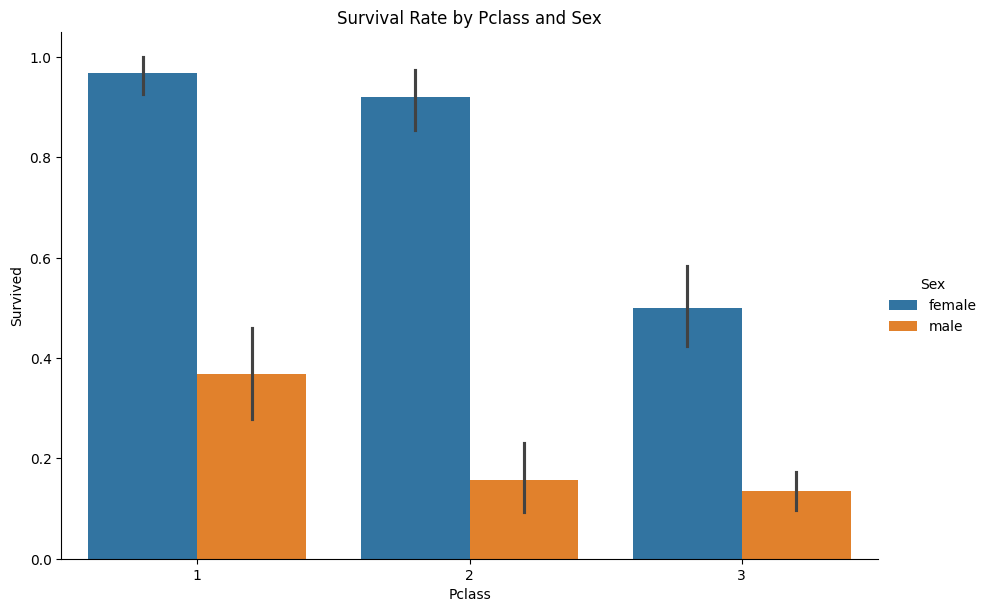

In [ ]:
sns.catplot(x='Pclass',y='Survived',hue='Sex',data=titanic_dt,kind='bar',height =6,aspect =1.5)
plt.title('Survival Rate by Pclass and Sex')
plt.show()

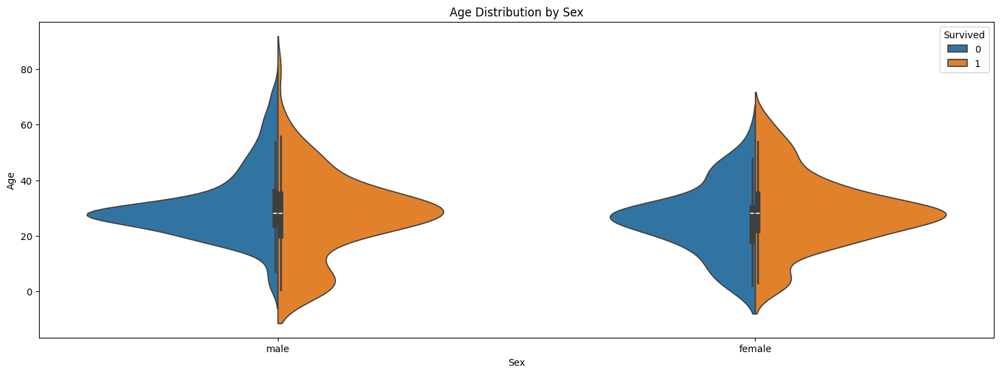

In [ ]:
plt.figure(figsize = (18,6))
sns.violinplot(x = 'Sex',y = 'Age',hue ='Survived',data = titanic_dt,split=True)
plt.title('Age Distribution by Sex')
plt.show()

# Correlation Analysis

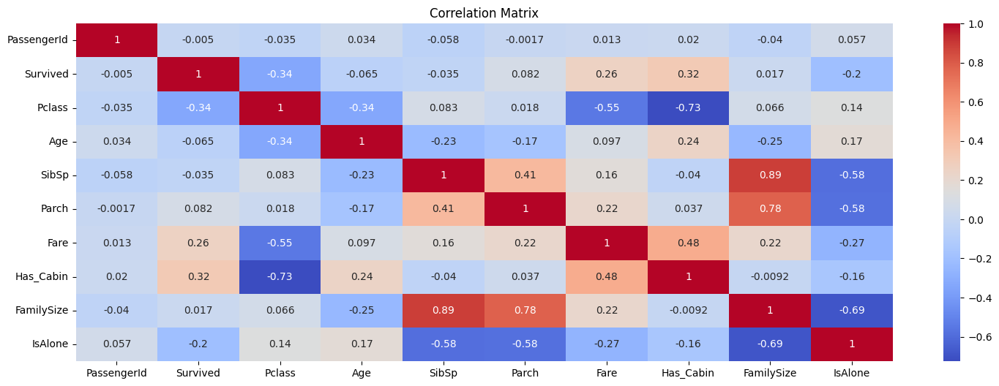

In [ ]:
plt.figure(figsize = (18,6))
numeric_cols = titanic_dt.select_dtypes(include = np.number)
corr_matrix = numeric_cols.corr()
sns.heatmap(corr_matrix,annot = True,cmap = 'coolwarm')
plt.title('Correlation Matrix')
plt.show()

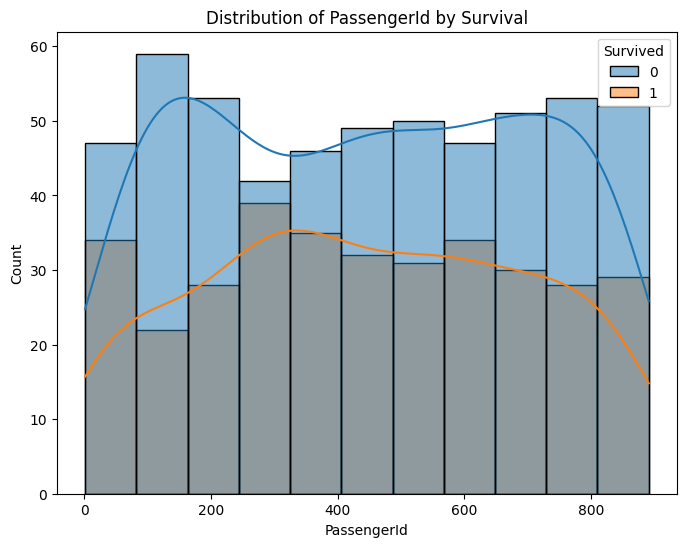

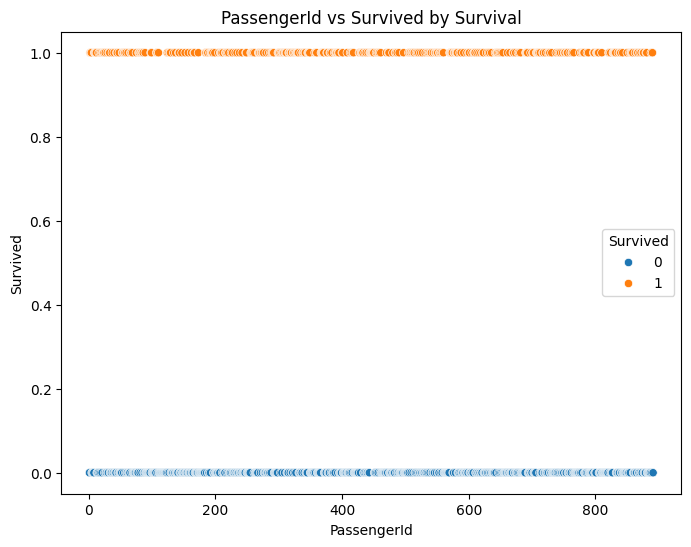

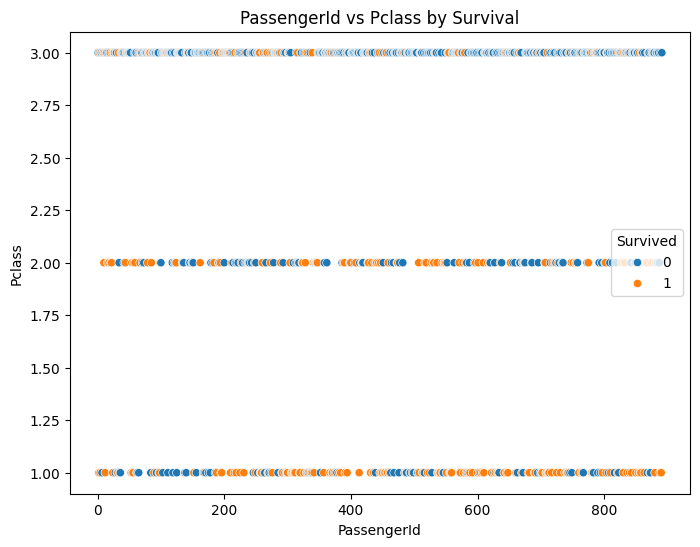

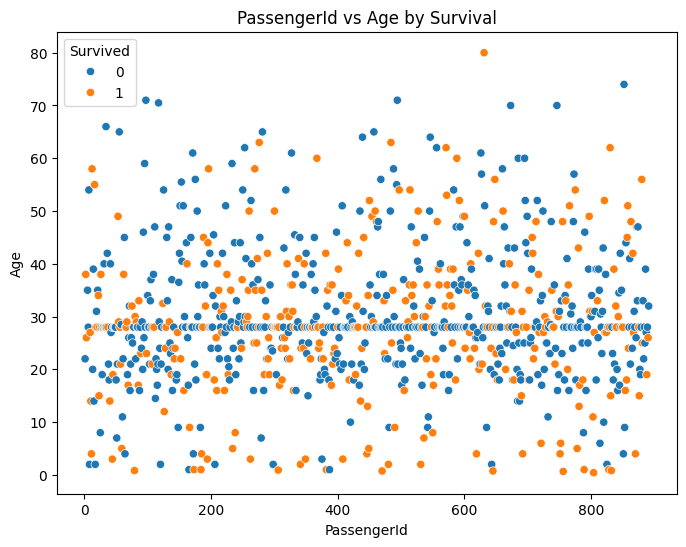

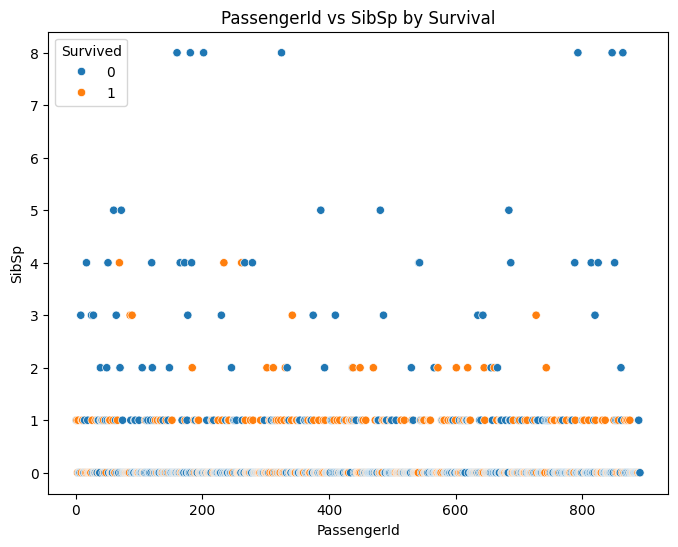

...

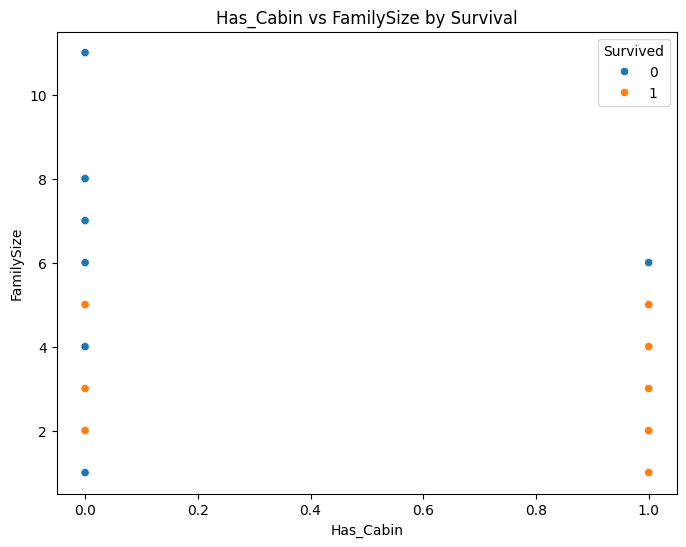

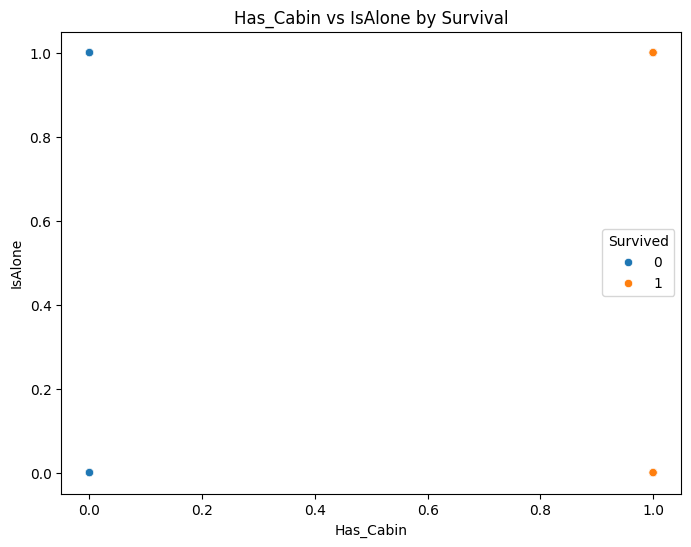

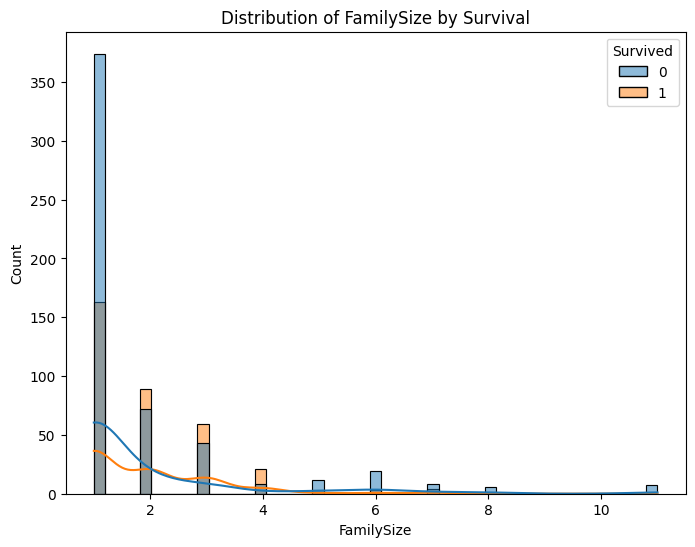

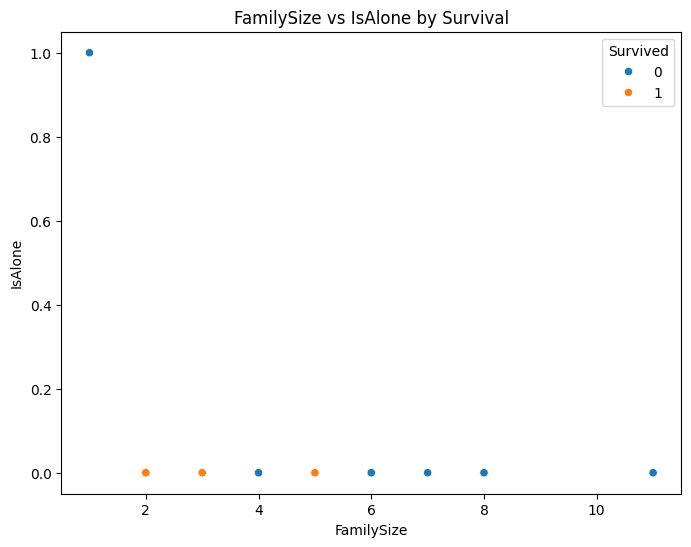

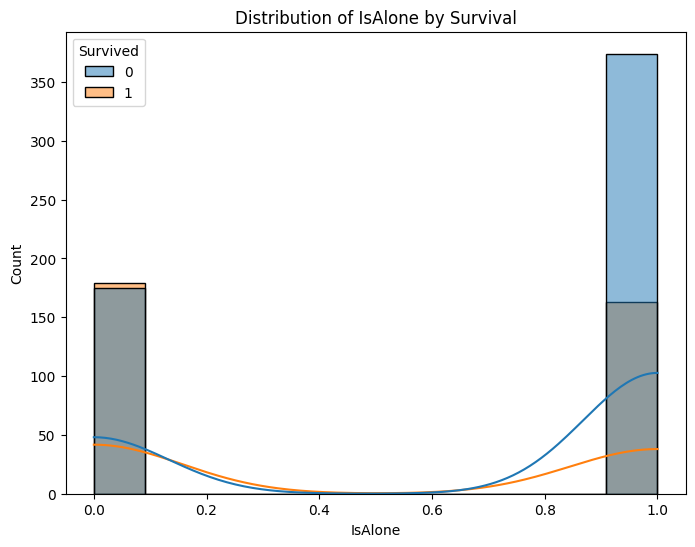

In [ ]:
numeric_cols = titanic_dt.select_dtypes(include=np.number).columns
n_cols = len(numeric_cols)

for i in range(n_cols):
    for j in range(i, n_cols):
        plt.figure(figsize=(8, 6))
        if i == j:
            sns.histplot(data=titanic_dt, x=numeric_cols[i], hue='Survived', kde=True)
            plt.title(f'Distribution of {numeric_cols[i]} by Survival')
        else:
            sns.scatterplot(data=titanic_dt, x=numeric_cols[i], y=numeric_cols[j], hue='Survived')
            plt.title(f'{numeric_cols[i]} vs {numeric_cols[j]} by Survival')
        plt.show()

In [ ]:
!pip install ydata-profiling -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.1/400.1 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 26.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.4/105.4 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 2.0 MB/s eta 0:00:00


In [ ]:
from ydata_profiling import ProfileReport
profile = ProfileReport(titanic_dt,title = 'Titanic Dataset Profile Report')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 29.47it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file(output_file = 'Titanic_Dataset_Profile_Report.html')

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]